In [50]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
import gif
from IPython.display import Image
import os

plt.rcParams['animation.embed_limit'] = 100

## No damping

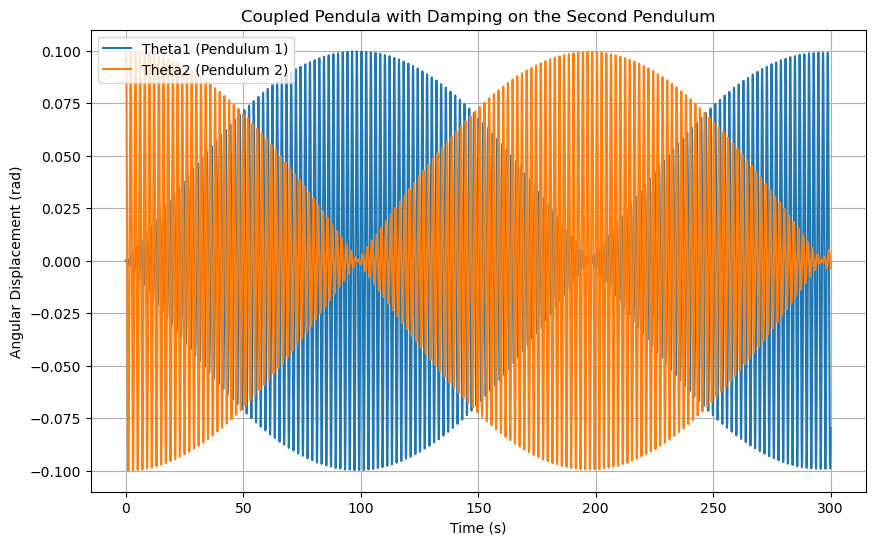

In [5]:
# Define the parameters
g = 9.81  # acceleration due to gravity, in m/s^2
l1 = 1.0  # length of the first pendulum, in meters
l2 = 1.0  # length of the second pendulum, in meters
m1 = 1.0  # mass of the first pendulum, in kg
m2 = 1.0  # mass of the second pendulum, in kg
k = 0.1   # coupling spring constant, in N/m
b = 0   # damping coefficient for the second pendulum

# Define the equations of motion
def equations(t, y):
    theta1, omega1, theta2, omega2 = y
    
    # Equations of motion
    dtheta1_dt = omega1
    domega1_dt = -(g / l1) * theta1 - (k / (m1 * l1**2)) * (theta1 - theta2)
    
    dtheta2_dt = omega2
    domega2_dt = -(g / l2) * theta2 - (b / (m2 * l2**2)) * omega2 - (k / (m2 * l2**2)) * (theta2 - theta1)
    
    return [dtheta1_dt, domega1_dt, dtheta2_dt, domega2_dt]

# Initial conditions: [theta1, omega1, theta2, omega2]
y0 = [0.0, 0.0, 0.1, 0.0]

# Time span for the simulation
t_span = (0,300)  # 10 seconds
t_eval = np.linspace(t_span[0], t_span[1], 10000)  # time points where solution is computed

# Solve the system of differential equations
solution = solve_ivp(equations, t_span, y0, t_eval=t_eval)

# Extract the results
theta1 = solution.y[0]
theta2 = solution.y[2]

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(t_eval, theta1, label='Theta1 (Pendulum 1)')
plt.plot(t_eval, theta2, label='Theta2 (Pendulum 2)', linestyle='-')
plt.xlabel('Time (s)')
plt.ylabel('Angular Displacement (rad)')
# plt.ylim([-0.0025, 0.0025])
plt.title('Coupled Pendula with Damping on the Second Pendulum')
plt.legend()
plt.grid(True)
plt.show()


Frequency should be related to the beating of the normal modes

In [6]:
np.sqrt(g/l1+2*k/(m1*l1**2)) - np.sqrt(g/l1)

0.03176645123810973

In [7]:
2*np.pi / ( np.sqrt(g/l1+2*k/(m1*l1**2)) - np.sqrt(g/l1) )

197.79311387611799

## Small damping

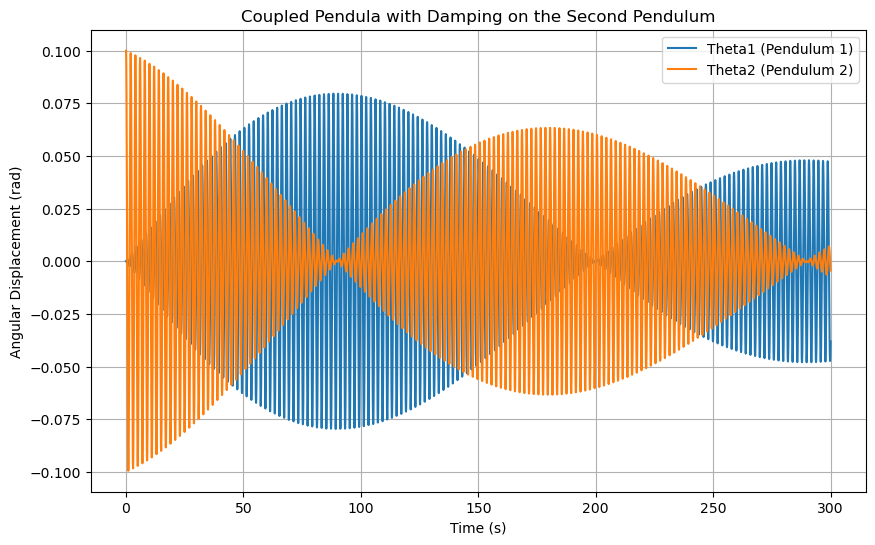

In [8]:


# Define the parameters
g = 9.81  # acceleration due to gravity, in m/s^2
l1 = 1.0  # length of the first pendulum, in meters
l2 = 1.0  # length of the second pendulum, in meters
m1 = 1.0  # mass of the first pendulum, in kg
m2 = 1.0  # mass of the second pendulum, in kg
k = 0.1   # coupling spring constant, in N/m
b = 0.01   # damping coefficient for the second pendulum

# Define the equations of motion
def equations(t, y):
    theta1, omega1, theta2, omega2 = y
    
    # Equations of motion
    dtheta1_dt = omega1
    domega1_dt = -(g / l1) * theta1 - (k / (m1 * l1**2)) * (theta1 - theta2)
    
    dtheta2_dt = omega2
    domega2_dt = -(g / l2) * theta2 - (b / (m2 * l2**2)) * omega2 - (k / (m2 * l2**2)) * (theta2 - theta1)
    
    return [dtheta1_dt, domega1_dt, dtheta2_dt, domega2_dt]

# Initial conditions: [theta1, omega1, theta2, omega2]
y0 = [0.0, 0.0, 0.1, 0.0]

# Time span for the simulation
t_span = (0,300)  # 10 seconds
t_eval = np.linspace(t_span[0], t_span[1], 10000)  # time points where solution is computed

# Solve the system of differential equations
solution = solve_ivp(equations, t_span, y0, t_eval=t_eval)

# Extract the results
theta1 = solution.y[0]
theta2 = solution.y[2]

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(t_eval, theta1, label='Theta1 (Pendulum 1)')
plt.plot(t_eval, theta2, label='Theta2 (Pendulum 2)', linestyle='-')
plt.xlabel('Time (s)')
plt.ylabel('Angular Displacement (rad)')
# plt.ylim([-0.0025, 0.0025])
plt.title('Coupled Pendula with Damping on the Second Pendulum')
plt.legend()
plt.grid(True)
plt.show()


## Damping compete with transfer

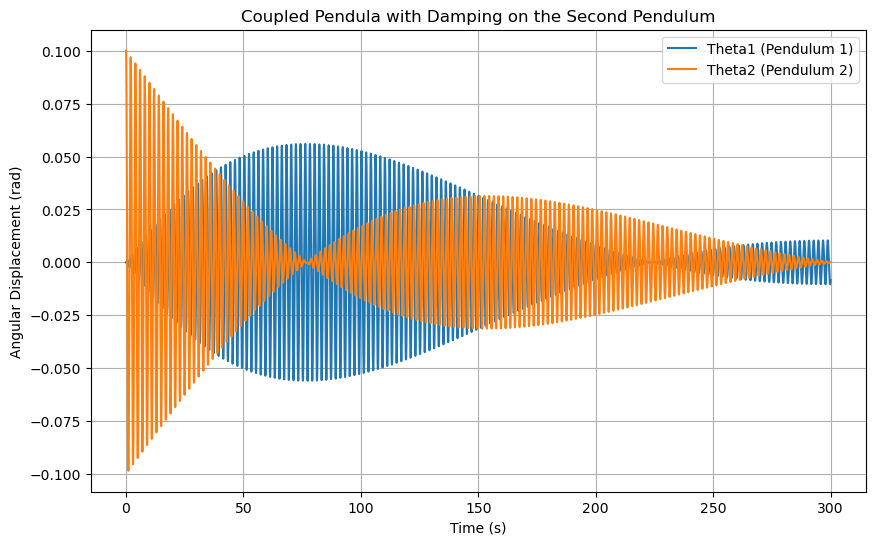

In [9]:

# Define the parameters
g = 9.81  # acceleration due to gravity, in m/s^2
l1 = 1.0  # length of the first pendulum, in meters
l2 = 1.0  # length of the second pendulum, in meters
m1 = 1.0  # mass of the first pendulum, in kg
m2 = 1.0  # mass of the second pendulum, in kg
k = 0.1   # coupling spring constant, in N/m
b = 0.03   # damping coefficient for the second pendulum

# Define the equations of motion
def equations(t, y):
    theta1, omega1, theta2, omega2 = y
    
    # Equations of motion
    dtheta1_dt = omega1
    domega1_dt = -(g / l1) * theta1 - (k / (m1 * l1**2)) * (theta1 - theta2)
    
    dtheta2_dt = omega2
    domega2_dt = -(g / l2) * theta2 - (b / (m2 * l2**2)) * omega2 - (k / (m2 * l2**2)) * (theta2 - theta1)
    
    return [dtheta1_dt, domega1_dt, dtheta2_dt, domega2_dt]

# Initial conditions: [theta1, omega1, theta2, omega2]
y0 = [0.0, 0.0, 0.1, 0.0]

# Time span for the simulation
t_span = (0,300)  # 10 seconds
t_eval = np.linspace(t_span[0], t_span[1], 10000)  # time points where solution is computed

# Solve the system of differential equations
solution = solve_ivp(equations, t_span, y0, t_eval=t_eval)

# Extract the results
theta1 = solution.y[0]
theta2 = solution.y[2]

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(t_eval, theta1, label='Theta1 (Pendulum 1)')
plt.plot(t_eval, theta2, label='Theta2 (Pendulum 2)', linestyle='-')
plt.xlabel('Time (s)')
plt.ylabel('Angular Displacement (rad)')
# plt.ylim([-0.0025, 0.0025])
plt.title('Coupled Pendula with Damping on the Second Pendulum')
plt.legend()
plt.grid(True)
plt.show()


In [10]:
# Define the parameters
g = 9.81  # acceleration due to gravity, in m/s^2
l1 = 1.0  # length of the first pendulum, in meters
l2 = 1.0  # length of the second pendulum, in meters
m1 = 1.0  # mass of the first pendulum, in kg
m2 = 1.0  # mass of the second pendulum, in kg
k = 0.1   # coupling spring constant, in N/m

# Uses the gif library from https://github.com/maxhumber/gif
@gif.frame
def plot(t_eval, theta1, theta2, b):
    # Plot the results
    plt.figure(figsize=(10, 6))
    plt.plot(t_eval, theta1, label='Theta1 (Pendulum 1)')
    plt.plot(t_eval, theta2, label='Theta2 (Pendulum 2)', linestyle='-')
    plt.xlabel('Time (s)')
    plt.ylabel('Angular Displacement (rad)')
    # plt.ylim([-0.0025, 0.0025])
    plt.title(f'b={b}')
    plt.legend()
    plt.grid(True)
        
bs = np.linspace(0,0.2,100)
frames = []
for i, b in enumerate(bs):
    # Define the equations of motion
    def equations(t, y):
        theta1, omega1, theta2, omega2 = y
        
        # Equations of motion
        dtheta1_dt = omega1
        domega1_dt = -(g / l1) * theta1 - (k / (m1 * l1**2)) * (theta1 - theta2)
        
        dtheta2_dt = omega2
        domega2_dt = -(g / l2) * theta2 - (b / (m2 * l2**2)) * omega2 - (k / (m2 * l2**2)) * (theta2 - theta1)
        
        return [dtheta1_dt, domega1_dt, dtheta2_dt, domega2_dt]
        
    # Initial conditions: [theta1, omega1, theta2, omega2]
    y0 = [0.0, 0.0, 0.1, 0.0]
    
    # Time span for the simulation
    t_span = (0,300)  # 10 seconds
    t_eval = np.linspace(t_span[0], t_span[1], 10000)  # time points where solution is computed
    
    # Solve the system of differential equations
    solution = solve_ivp(equations, t_span, y0, t_eval=t_eval)
    
    # Extract the results
    theta1 = solution.y[0]
    theta2 = solution.y[2]

    frame = plot(t_eval, theta1, theta2,b)
    frames.append(frame)
gif.save(frames, "./test.gif", duration=250)

In [11]:
os.rename("./test.gif", "./test.gif.png")

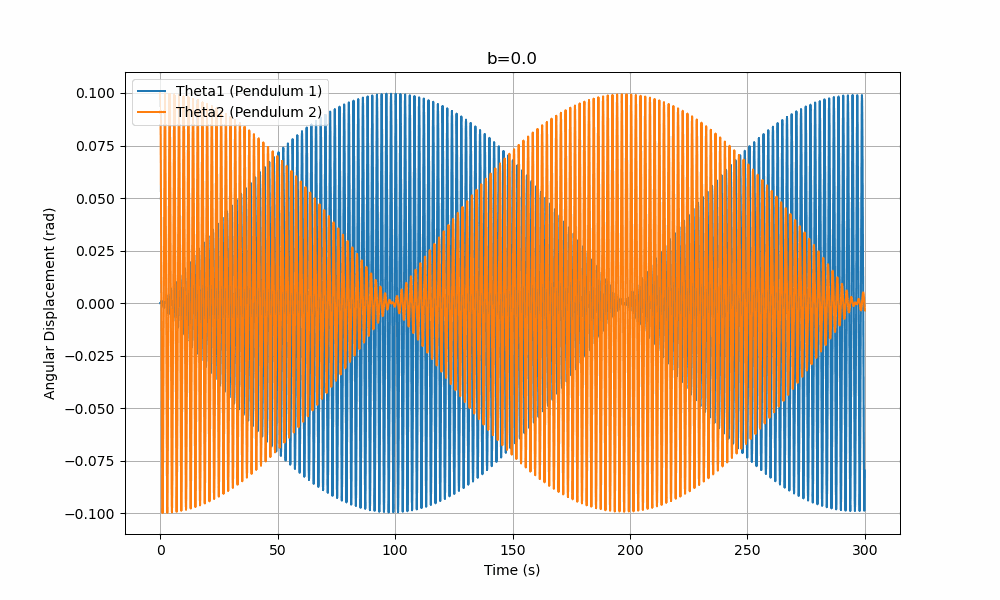

In [12]:
Image(filename="./test.gif.png")


KeyboardInterrupt



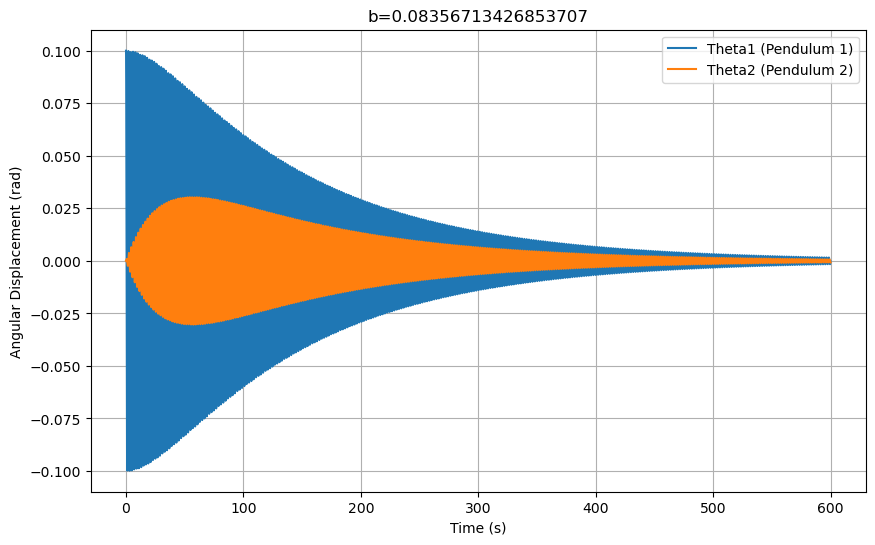

In [13]:
# Define the parameters
g = 9.81  # acceleration due to gravity, in m/s^2
l1 = 1.0  # length of the first pendulum, in meters
l2 = 1.0  # length of the second pendulum, in meters
m1 = 1.0  # mass of the first pendulum, in kg
m2 = 1.0  # mass of the second pendulum, in kg
k = 0.1   # coupling spring constant, in N/m

# Uses the gif library from https://github.com/maxhumber/gif
@gif.frame
def plot(t_eval, theta1, theta2, b):
    # Plot the results
    plt.figure(figsize=(10, 6))
    plt.plot(t_eval, theta1, label='Theta1 (Pendulum 1)')
    plt.plot(t_eval, theta2, label='Theta2 (Pendulum 2)', linestyle='-')
    plt.xlabel('Time (s)')
    plt.ylabel('Angular Displacement (rad)')
    # plt.ylim([-0.0025, 0.0025])
    plt.title(f'b={b}')
    plt.legend()
    plt.grid(True)
        
bs = np.linspace(0,0.1,500)
frames = []
for i, b in enumerate(bs):
    # Define the equations of motion
    def equations(t, y):
        theta1, omega1, theta2, omega2 = y
        
        # Equations of motion
        dtheta1_dt = omega1
        domega1_dt = -(g / l1) * theta1 - (k / (m1 * l1**2)) * (theta1 - theta2)
        
        dtheta2_dt = omega2
        domega2_dt = -(g / l2) * theta2 - (b / (m2 * l2**2)) * omega2 - (k / (m2 * l2**2)) * (theta2 - theta1)
        
        return [dtheta1_dt, domega1_dt, dtheta2_dt, domega2_dt]
        
    # Initial conditions: [theta1, omega1, theta2, omega2]
    y0 = [0.1, 0.0, 0.0, 0.0]
    
    # Time span for the simulation
    t_span = (0,600)  # 10 seconds
    t_eval = np.linspace(t_span[0], t_span[1], 10000)  # time points where solution is computed
    
    # Solve the system of differential equations
    solution = solve_ivp(equations, t_span, y0, t_eval=t_eval)
    
    # Extract the results
    theta1 = solution.y[0]
    theta2 = solution.y[2]

    frame = plot(t_eval, theta1, theta2,b)
    frames.append(frame)
gif.save(frames, "./test3.gif", duration=250)

In [ ]:
os.rename("./test3.gif", "./test3.gif.png")

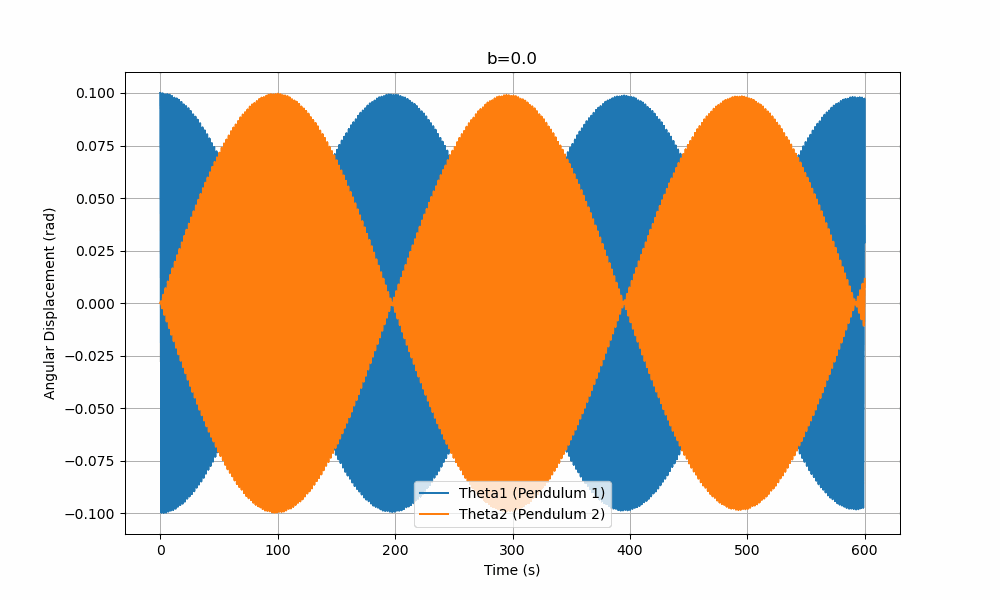

In [14]:
Image(filename="./test3.gif.png")

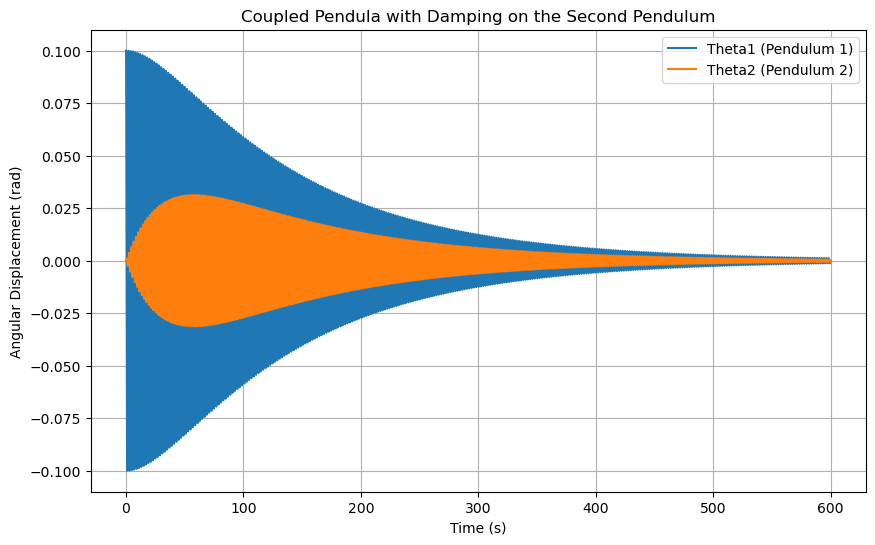

In [15]:

# Define the parameters
g = 9.81  # acceleration due to gravity, in m/s^2
l1 = 1.0  # length of the first pendulum, in meters
l2 = 1.0  # length of the second pendulum, in meters
m1 = 1.0  # mass of the first pendulum, in kg
m2 = 1.0  # mass of the second pendulum, in kg
k = 0.1   # coupling spring constant, in N/m
b = 0.08   # damping coefficient for the second pendulum

# Define the equations of motion
def equations(t, y):
    theta1, omega1, theta2, omega2 = y
    
    # Equations of motion
    dtheta1_dt = omega1
    domega1_dt = -(g / l1) * theta1 - (k / (m1 * l1**2)) * (theta1 - theta2)
    
    dtheta2_dt = omega2
    domega2_dt = -(g / l2) * theta2 - (b / (m2 * l2**2)) * omega2 - (k / (m2 * l2**2)) * (theta2 - theta1)
    
    return [dtheta1_dt, domega1_dt, dtheta2_dt, domega2_dt]

# Initial conditions: [theta1, omega1, theta2, omega2]
y0 = [0.1, 0.0, 0.0, 0.0]

# Time span for the simulation
t_span = (0,600)  # 10 seconds
t_eval = np.linspace(t_span[0], t_span[1], 100000)  # time points where solution is computed

# Solve the system of differential equations
solution = solve_ivp(equations, t_span, y0, t_eval=t_eval)

# Extract the results
theta1 = solution.y[0]
theta2 = solution.y[2]

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(t_eval, theta1, label='Theta1 (Pendulum 1)')
plt.plot(t_eval, theta2, label='Theta2 (Pendulum 2)', linestyle='-')
plt.xlabel('Time (s)')
plt.ylabel('Angular Displacement (rad)')
# plt.ylim([-0.0025, 0.0025])
plt.title('Coupled Pendula with Damping on the Second Pendulum')
plt.legend()
plt.grid(True)
plt.show()


## No coupling

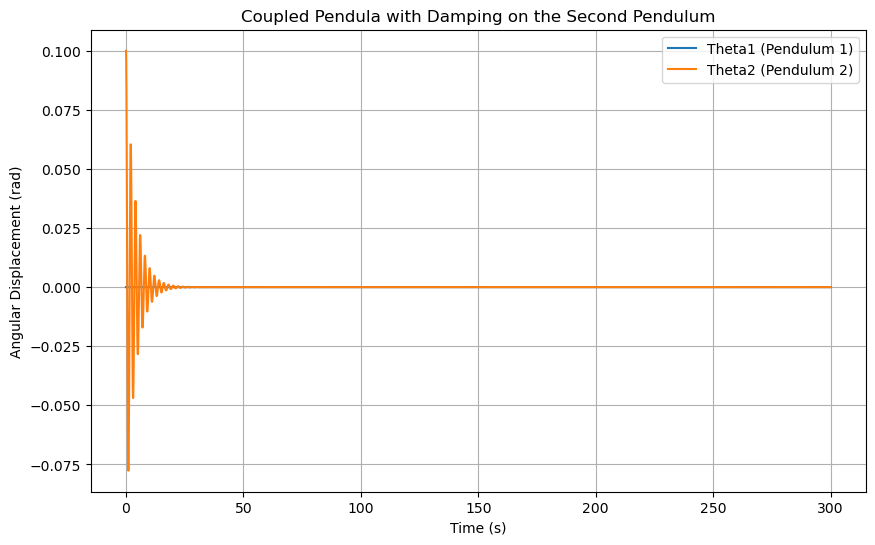

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# Define the parameters
g = 9.81  # acceleration due to gravity, in m/s^2
l1 = 1.0  # length of the first pendulum, in meters
l2 = 1.0  # length of the second pendulum, in meters
m1 = 1.0  # mass of the first pendulum, in kg
m2 = 1.0  # mass of the second pendulum, in kg
k = 0.0   # coupling spring constant, in N/m
b = 0.5   # damping coefficient for the second pendulum

# Define the equations of motion
def equations(t, y):
    theta1, omega1, theta2, omega2 = y
    
    # Equations of motion
    dtheta1_dt = omega1
    domega1_dt = -(g / l1) * theta1 - (k / (m1 * l1**2)) * (theta1 - theta2)
    
    dtheta2_dt = omega2
    domega2_dt = -(g / l2) * theta2 - (b / (m2 * l2**2)) * omega2 - (k / (m2 * l2**2)) * (theta2 - theta1)
    
    return [dtheta1_dt, domega1_dt, dtheta2_dt, domega2_dt]

# Initial conditions: [theta1, omega1, theta2, omega2]
y0 = [0.0, 0.0, 0.1, 0.0]

# Time span for the simulation
t_span = (0,300)  # 10 seconds
t_eval = np.linspace(t_span[0], t_span[1], 10000)  # time points where solution is computed

# Solve the system of differential equations
solution = solve_ivp(equations, t_span, y0, t_eval=t_eval)

# Extract the results
theta1 = solution.y[0]
theta2 = solution.y[2]

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(t_eval, theta1, label='Theta1 (Pendulum 1)')
plt.plot(t_eval, theta2, label='Theta2 (Pendulum 2)', linestyle='-')
plt.xlabel('Time (s)')
plt.ylabel('Angular Displacement (rad)')
# plt.ylim([-0.0025, 0.0025])
plt.title('Coupled Pendula with Damping on the Second Pendulum')
plt.legend()
plt.grid(True)
plt.show()


## Indirectly coupled pendulums

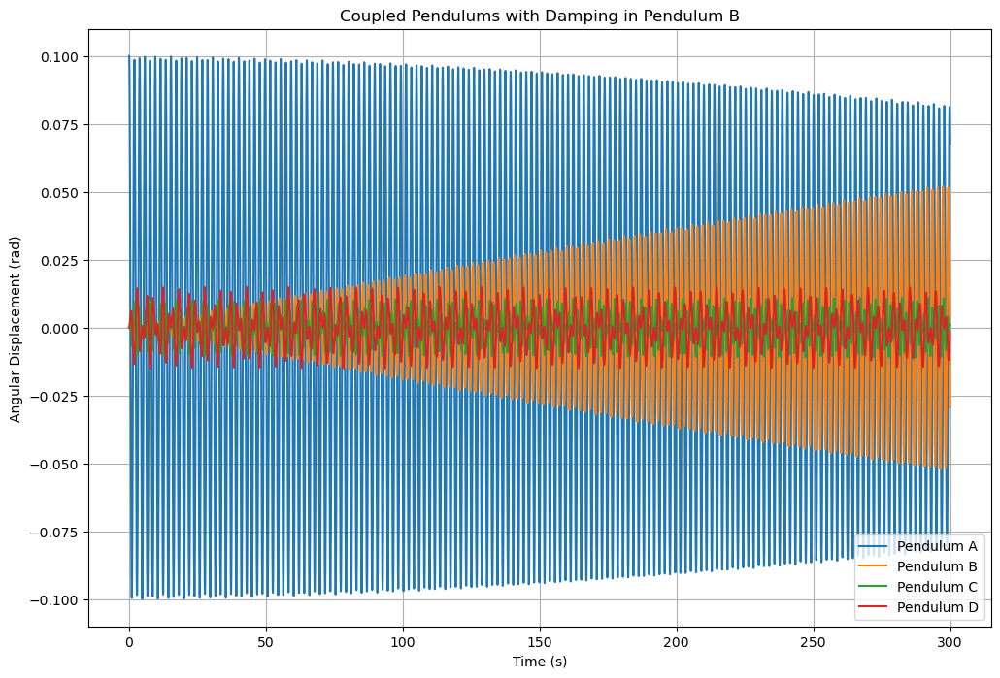

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# Parameters
g = 9.81  # acceleration due to gravity, in m/s^2
l_A, l_B = 1.0, 1.0  # lengths of the pendulums, in meters
l_C = 0.5
l_D = 3
m_A, m_B, m_C, m_D = 1.0, 1.0, 1.0, 1.0  # masses of the pendulums, in kg
# m_D=100
k = 0.5  # coupling constant
b = 00.0  # damping coefficient for pendulum B

# Define the system of ODEs
def equations(t, y):
    theta_A, omega_A, theta_B, omega_B, theta_C, omega_C, theta_D, omega_D = y
    
    dtheta_A = omega_A
    domega_A = -((g/l_A) + (2*k/(m_A)))*theta_A + (k/(m_A))*(theta_C + theta_D)
    
    dtheta_B = omega_B
    domega_B = - ((g/l_B) + (2*k/(m_B)))*theta_B + (k/(m_B))*(theta_C + theta_D)
    
    dtheta_C = omega_C
    domega_C = -b/(m_C)*omega_C -((g/l_C) + (2*k/(m_C)))*theta_C + (k/(m_C))*(theta_A + theta_B)
    
    dtheta_D = omega_D
    domega_D = -((g/l_D) + (2*k/(m_D)))*theta_D + (k/(m_D))*(theta_A + theta_B)

    return [dtheta_A, domega_A, dtheta_B, domega_B, dtheta_C, domega_C, dtheta_D, domega_D]

# Initial conditions
theta_A0 = 0.1  # initial amplitude for pendulum A
omega_A0 = 0.0  # initial angular velocity for pendulum A
theta_B0 = 0.0  # initial amplitude for pendulum B
omega_B0 = 0.0  # initial angular velocity for pendulum B
theta_C0 = 0.0  # initial amplitude for pendulum C
omega_C0 = 0.0  # initial angular velocity for pendulum C
theta_D0 = 0.0  # initial amplitude for pendulum D
omega_D0 = 0.0  # initial angular velocity for pendulum D

# Bundle initial conditions into a single list
initial_conditions = [theta_A0, omega_A0, theta_B0, omega_B0, theta_C0, omega_C0, theta_D0, omega_D0]

# Time span for the simulation
t_span = (0, 300)  # start and end times
t_eval = np.linspace(*t_span, 100000)  # time points where the solution is computed

# Solve the system of ODEs
solution = solve_ivp(equations, t_span, initial_conditions, t_eval=t_eval, method='RK45')

# Extract the solutions for each pendulum
theta_A_sol = solution.y[0]
theta_B_sol = solution.y[2]
theta_C_sol = solution.y[4]
theta_D_sol = solution.y[6]

# Plot the results
plt.figure(figsize=(12, 8))
plt.plot(t_eval, theta_A_sol, label='Pendulum A')
plt.plot(t_eval, theta_B_sol, label='Pendulum B')
plt.plot(t_eval, theta_C_sol, label='Pendulum C')
plt.plot(t_eval, theta_D_sol, label='Pendulum D')
plt.xlabel('Time (s)')
plt.ylabel('Angular Displacement (rad)')
plt.title('Coupled Pendulums with Damping in Pendulum B')
plt.legend()
plt.grid(True)
plt.show()


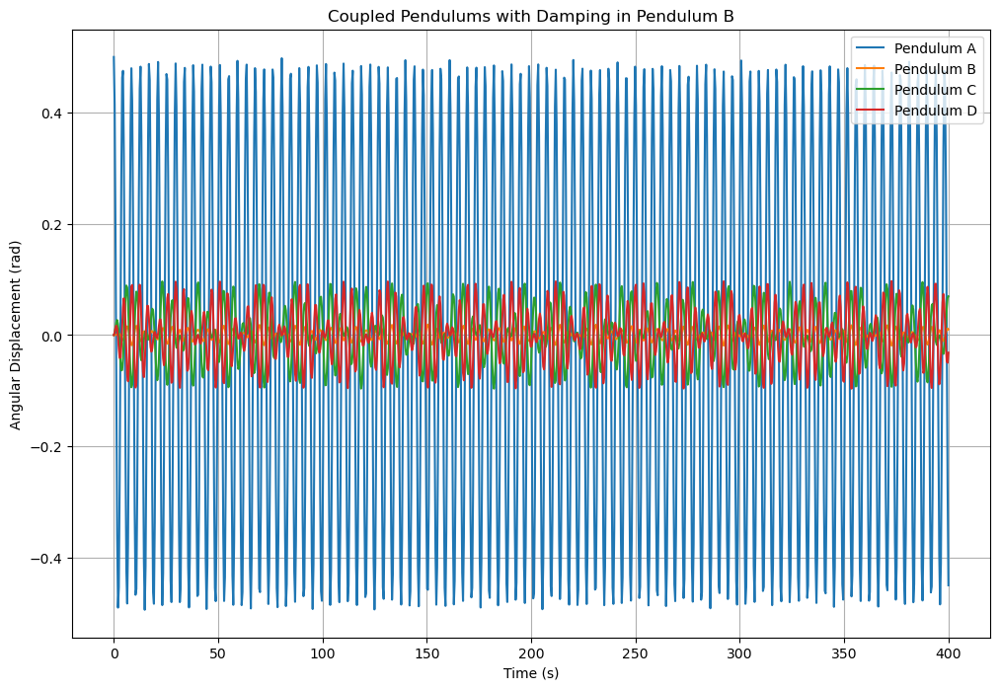

In [57]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# Parameters
w_A, w_B = np.sqrt(2), np.sqrt(2)  # lengths of the pendulums, in meters
w_C = 1
w_D = np.sqrt(3)
k = 0.1  # coupling constant
b = 10.1*0  # damping coefficient for pendulum C

# Define the system of ODEs
def equations(t, y):
    theta_A, omega_A, theta_B, omega_B, theta_C, omega_C, theta_D, omega_D = y
    
    dtheta_A = omega_A
    domega_A = -(w_A**2 + 2*k)*theta_A + k*(theta_C + theta_D)
    
    dtheta_B = omega_B
    domega_B = - (w_B**2 + 2*k)*theta_B + k*(theta_C + theta_D)
    
    dtheta_C = omega_C
    domega_C = -b*omega_C -(w_C**2 + 2*k)*theta_C + k*(theta_A + theta_B)
    
    dtheta_D = omega_D
    domega_D = -(w_D**2 + 2*k)*theta_D + k*(theta_A + theta_B)

    return [dtheta_A, domega_A, dtheta_B, domega_B, dtheta_C, domega_C, dtheta_D, domega_D]

# Initial conditions
theta_A0 = 0.5  # initial amplitude for pendulum A
omega_A0 = 0.0  # initial angular velocity for pendulum A
theta_B0 = 0.0  # initial amplitude for pendulum B
omega_B0 = 0.0  # initial angular velocity for pendulum B
theta_C0 = 0.0  # initial amplitude for pendulum C
omega_C0 = 0.0  # initial angular velocity for pendulum C
theta_D0 = 0.0  # initial amplitude for pendulum D
omega_D0 = 0.0  # initial angular velocity for pendulum D

# Bundle initial conditions into a single list
initial_conditions = [theta_A0, omega_A0, theta_B0, omega_B0, theta_C0, omega_C0, theta_D0, omega_D0]

# Time span for the simulation
t_span = (0, 400)  # start and end times
t_eval = np.linspace(*t_span, 1000)  # time points where the solution is computed

# Solve the system of ODEs
solution = solve_ivp(equations, t_span, initial_conditions, t_eval=t_eval, method='RK45')

# Extract the solutions for each pendulum
theta_A_sol = solution.y[0]
theta_B_sol = solution.y[2]
theta_C_sol = solution.y[4]
theta_D_sol = solution.y[6]

# Plot the results
plt.figure(figsize=(12, 8))
plt.plot(t_eval, theta_A_sol, label='Pendulum A')
plt.plot(t_eval, theta_B_sol, label='Pendulum B')
plt.plot(t_eval, theta_C_sol, label='Pendulum C')
plt.plot(t_eval, theta_D_sol, label='Pendulum D')
plt.xlabel('Time (s)')
plt.ylabel('Angular Displacement (rad)')
plt.title('Coupled Pendulums with Damping in Pendulum B')
plt.legend()
plt.grid(True)
plt.show()


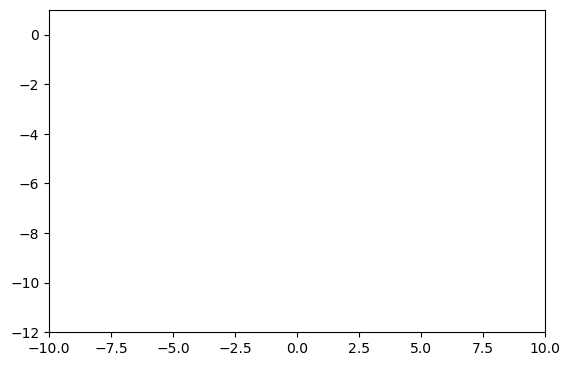

In [53]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.integrate import solve_ivp
from IPython.display import HTML

# Use the inline backend for matplotlib
%matplotlib inline

# Parameters
w_A, w_B = np.sqrt(2), np.sqrt(2)  # natural frequencies of the pendulums
w_C = 1
w_D = np.sqrt(3)
k = 0.1  # coupling constant
b = 10.1 * 0  # damping coefficient for pendulum C

# Define the system of ODEs
def equations(t, y):
    theta_A, omega_A, theta_B, omega_B, theta_C, omega_C, theta_D, omega_D = y
    
    dtheta_A = omega_A
    domega_A = -(w_A**2 + 2*k) * theta_A + k * (theta_C + theta_D)
    
    dtheta_B = omega_B
    domega_B = -(w_B**2 + 2*k) * theta_B + k * (theta_C + theta_D)
    
    dtheta_C = omega_C
    domega_C = -b * omega_C - (w_C**2 + 2*k) * theta_C + k * (theta_A + theta_B)
    
    dtheta_D = omega_D
    domega_D = -(w_D**2 + 2*k) * theta_D + k * (theta_A + theta_B)

    return [dtheta_A, domega_A, dtheta_B, domega_B, dtheta_C, domega_C, dtheta_D, domega_D]

# Initial conditions
theta_A0 = 0.5  # initial amplitude for pendulum A
omega_A0 = 0.0  # initial angular velocity for pendulum A
theta_B0 = 0.0  # initial amplitude for pendulum B
omega_B0 = 0.0  # initial angular velocity for pendulum B
theta_C0 = 0.0  # initial amplitude for pendulum C
omega_C0 = 0.0  # initial angular velocity for pendulum C
theta_D0 = 0.0  # initial amplitude for pendulum D
omega_D0 = 0.0  # initial angular velocity for pendulum D

# Bundle initial conditions into a single list
initial_conditions = [theta_A0, omega_A0, theta_B0, omega_B0, theta_C0, omega_C0, theta_D0, omega_D0]

# Time span for the simulation
t_span = (0, 500)  # start and end times
t_eval = np.linspace(*t_span, 2000)  # time points where the solution is computed

# Solve the system of ODEs
solution = solve_ivp(equations, t_span, initial_conditions, t_eval=t_eval, method='RK45')

# Extract the solutions for each pendulum
theta_A_sol = solution.y[0]
theta_B_sol = solution.y[2]
theta_C_sol = solution.y[4]
theta_D_sol = solution.y[6]

# Convert angular displacements to Cartesian coordinates for animation
offset_A = -5  # horizontal offset for pendulum A
offset_B = 5   # horizontal offset for pendulum B
offset_C_vertical = 0  # vertical offset for pendulum C
offset_D_vertical = 0  # vertical offset for pendulum D
l_ab = 4.9
l_c = 9.8
l_d = 3.27

x_A = offset_A + l_ab * np.sin(theta_A_sol)
y_A = -l_ab * np.cos(theta_A_sol)
x_B = offset_B + l_ab * np.sin(theta_B_sol)
y_B = -l_ab * np.cos(theta_B_sol)
x_C = l_c * np.sin(theta_C_sol)
y_C = offset_C_vertical - l_c * np.cos(theta_C_sol)
x_D = l_d * np.sin(theta_D_sol)
y_D = offset_D_vertical - l_d * np.cos(theta_D_sol)

# Set up the figure and axis
fig, ax = plt.subplots()
ax.set_xlim(-10, 10)
ax.set_ylim(-12, 1)
ax.set_aspect('equal')

# Create lines for each pendulum
line_A, = ax.plot([], [], 'o-', lw=2, label='Pendulum A')
line_B, = ax.plot([], [], 'o-', lw=2, label='Pendulum B')
line_C, = ax.plot([], [], 'o-', lw=2, label='Pendulum C')
line_D, = ax.plot([], [], 'o-', lw=2, label='Pendulum D')
line_AC, = ax.plot([], [], color='grey', lw=1)  # Line connecting A to C
line_AD, = ax.plot([], [], color='grey', lw=1)  # Line connecting A to D
line_CB, = ax.plot([], [], color='grey', lw=1)  # Line connecting C to B
line_DB, = ax.plot([], [], color='grey', lw=1)  # Line connecting D to B
# ax.legend()

# Initialize the animation
def init():
    line_A.set_data([], [])
    line_B.set_data([], [])
    line_C.set_data([], [])
    line_D.set_data([], [])
    line_AC.set_data([], [])
    line_AD.set_data([], [])
    line_CB.set_data([], [])
    line_DB.set_data([], [])
    return line_A, line_B, line_C, line_D, line_AC, line_AD, line_CB, line_DB

# Update function for the animation
def update(frame):
    line_A.set_data([offset_A, x_A[frame]], [0, y_A[frame]])
    line_B.set_data([offset_B, x_B[frame]], [0, y_B[frame]])
    line_C.set_data([0, x_C[frame]], [offset_C_vertical, y_C[frame]])
    line_D.set_data([0, x_D[frame]], [offset_D_vertical, y_D[frame]])
    line_AC.set_data([x_A[frame], x_C[frame]], [y_A[frame], y_C[frame]])
    line_AD.set_data([x_A[frame], x_D[frame]], [y_A[frame], y_D[frame]])
    line_CB.set_data([x_C[frame], x_B[frame]], [y_C[frame], y_B[frame]])
    line_DB.set_data([x_D[frame], x_B[frame]], [y_D[frame], y_B[frame]])
    return line_A, line_B, line_C, line_D, line_AC, line_AD, line_CB, line_DB

# Create the animation
ani = FuncAnimation(fig, update, frames=len(t_eval), init_func=init, blit=False, interval=40)

# Display the animation as HTML
# HTML(ani.to_jshtml())

# Save the animation as a file
ani.save('pendulum_animation-destructive.mp4', writer='ffmpeg', fps=30)




In [55]:
# Display the saved animation
from IPython.display import Video
Video("pendulum_animation-destructive.mp4")

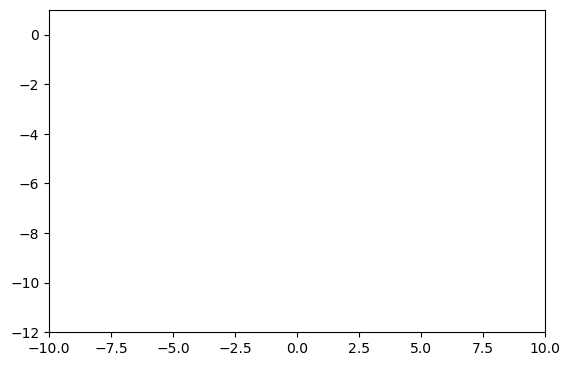

In [62]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.integrate import solve_ivp
from IPython.display import HTML

# Use the inline backend for matplotlib
%matplotlib inline

# Parameters
w_A, w_B = np.sqrt(2), np.sqrt(2)  # natural frequencies of the pendulums
w_C = 1
w_D = np.sqrt(3)
k = 0.1  # coupling constant
b = 10.1 * 1  # damping coefficient for pendulum C

# Define the system of ODEs
def equations(t, y):
    theta_A, omega_A, theta_B, omega_B, theta_C, omega_C, theta_D, omega_D = y
    
    dtheta_A = omega_A
    domega_A = -(w_A**2 + 2*k) * theta_A + k * w_A**2*(theta_C/w_C**2 + theta_D/w_D**2)
    
    dtheta_B = omega_B
    domega_B = -(w_B**2 + 2*k) * theta_B + k * w_B**2*(theta_C/w_C**2 + theta_D/w_D**2)
    
    dtheta_C = omega_C
    domega_C = -b * omega_C - (w_C**2 + 2*k) * theta_C + k * w_C**2*(theta_A/w_A**2 + theta_B/w_B**2)
    
    dtheta_D = omega_D
    domega_D = -(w_D**2 + 2*k) * theta_D + k * w_D**2*(theta_A/w_A**2 + theta_B/w_B**2)

    return [dtheta_A, domega_A, dtheta_B, domega_B, dtheta_C, domega_C, dtheta_D, domega_D]

# Initial conditions
theta_A0 = 0.5  # initial amplitude for pendulum A
omega_A0 = 0.0  # initial angular velocity for pendulum A
theta_B0 = 0.0  # initial amplitude for pendulum B
omega_B0 = 0.0  # initial angular velocity for pendulum B
theta_C0 = 0.0  # initial amplitude for pendulum C
omega_C0 = 0.0  # initial angular velocity for pendulum C
theta_D0 = 0.0  # initial amplitude for pendulum D
omega_D0 = 0.0  # initial angular velocity for pendulum D

# Bundle initial conditions into a single list
initial_conditions = [theta_A0, omega_A0, theta_B0, omega_B0, theta_C0, omega_C0, theta_D0, omega_D0]

# Time span for the simulation
t_span = (0, 500)  # start and end times
t_eval = np.linspace(*t_span, 2000)  # time points where the solution is computed

# Solve the system of ODEs
solution = solve_ivp(equations, t_span, initial_conditions, t_eval=t_eval, method='RK45')

# Extract the solutions for each pendulum
theta_A_sol = solution.y[0]
theta_B_sol = solution.y[2]
theta_C_sol = solution.y[4]
theta_D_sol = solution.y[6]

# Convert angular displacements to Cartesian coordinates for animation
offset_A = -5  # horizontal offset for pendulum A
offset_B = 5   # horizontal offset for pendulum B
offset_C_vertical = 0  # vertical offset for pendulum C
offset_D_vertical = 0  # vertical offset for pendulum D
l_ab = 4.9
l_c = 9.8
l_d = 3.27

x_A = offset_A + l_ab * np.sin(theta_A_sol)
y_A = -l_ab * np.cos(theta_A_sol)
x_B = offset_B + l_ab * np.sin(theta_B_sol)
y_B = -l_ab * np.cos(theta_B_sol)
x_C = l_c * np.sin(theta_C_sol)
y_C = offset_C_vertical - l_c * np.cos(theta_C_sol)
x_D = l_d * np.sin(theta_D_sol)
y_D = offset_D_vertical - l_d * np.cos(theta_D_sol)

# Set up the figure and axis
fig, ax = plt.subplots()
ax.set_xlim(-10, 10)
ax.set_ylim(-12, 1)
ax.set_aspect('equal')

# Create lines for each pendulum
line_A, = ax.plot([], [], 'o-', lw=2, label='Pendulum A')
line_B, = ax.plot([], [], 'o-', lw=2, label='Pendulum B')
line_C, = ax.plot([], [], 'o-', lw=2, label='Pendulum C')
line_D, = ax.plot([], [], 'o-', lw=2, label='Pendulum D')
line_AC, = ax.plot([], [], color='grey', lw=1)  # Line connecting A to C
line_AD, = ax.plot([], [], color='grey', lw=1)  # Line connecting A to D
line_CB, = ax.plot([], [], color='grey', lw=1)  # Line connecting C to B
line_DB, = ax.plot([], [], color='grey', lw=1)  # Line connecting D to B
# ax.legend()

# Initialize the animation
def init():
    line_A.set_data([], [])
    line_B.set_data([], [])
    line_C.set_data([], [])
    line_D.set_data([], [])
    line_AC.set_data([], [])
    line_AD.set_data([], [])
    line_CB.set_data([], [])
    line_DB.set_data([], [])
    return line_A, line_B, line_C, line_D, line_AC, line_AD, line_CB, line_DB

# Update function for the animation
def update(frame):
    line_A.set_data([offset_A, x_A[frame]], [0, y_A[frame]])
    line_B.set_data([offset_B, x_B[frame]], [0, y_B[frame]])
    line_C.set_data([0, x_C[frame]], [offset_C_vertical, y_C[frame]])
    line_D.set_data([0, x_D[frame]], [offset_D_vertical, y_D[frame]])
    line_AC.set_data([x_A[frame], x_C[frame]], [y_A[frame], y_C[frame]])
    line_AD.set_data([x_A[frame], x_D[frame]], [y_A[frame], y_D[frame]])
    line_CB.set_data([x_C[frame], x_B[frame]], [y_C[frame], y_B[frame]])
    line_DB.set_data([x_D[frame], x_B[frame]], [y_D[frame], y_B[frame]])
    return line_A, line_B, line_C, line_D, line_AC, line_AD, line_CB, line_DB

# Create the animation
ani = FuncAnimation(fig, update, frames=len(t_eval), init_func=init, blit=False, interval=40)

# Display the animation as HTML
# HTML(ani.to_jshtml())

# Save the animation as a file
ani.save('pendulum-remove-destructive.mp4', writer='ffmpeg', fps=30)




In [63]:
from IPython.display import Video
Video("pendulum-remove-destructive.mp4")